 # Simulated Annealing for TSP C implementation

made by Daniel Grbac Bravo and Kealan Barry

 ### How to run the program

- `-n` or `-N`: This argument is used to specify the number of cities. The value for this argument should be an integer. If this argument is not provided, the default value of 30 is used.

- `-t` or `-T`: This argument is used to specify the initial temperature. The value for this argument should be a float. If this argument is not provided, the default value of 100 is used.

- `-c` or `-C`: This argument is used to specify the cooling rate. The value for this argument should be a float. If this argument is not provided, the default value of 0.99 is used.

- `-file` or `-FILE`: This argument is used to specify the input file containing the city coordinates. The value for this argument should be the path to the input file. If this argument is not provided, the program will generate random city coordinates.

- `-random` or `-RANDOM`: This argument is used to generate random city coordinates. If this argument is not provided, the program will read the city coordinates from the input file specified by the `-file` argument.

Note that the program uses `strcmp()` to compare the argument strings, so the arguments are case-sensitive. Also, the program assumes that the arguments are provided in the correct order. If an argument is missing or the value for an argument is not provided, the program will use the default value.

In [353]:
%%bash
make clean
rm data.csv
rm path.csv
rm coordinates.csv 
make run ARGS="-C 0.999 -T 100 -N 50 -FILE input.csv"

rm: coordinates.csv: No such file or directory


gcc -c -o src/Energy.o src/Energy.c 
gcc -c -o src/Temperature.o src/Temperature.c 
gcc -c -o src/IOManager.o src/IOManager.c 
gcc -c -o src/main.o src/main.c 
gcc -c -o src/Path.o src/Path.c 
building...
running...
./TSPSA -C 0.999 -T 100 -N 50 -FILE input.csv
Cooling rate: 0.999000
Temperature: 100.000000
Number of cities: 50
Reading coordinates from file.
Beginning simulated annealing...
Termination conditions Reached.
[Termination Statistics]
Final Energy: 755
Final Temperature: 0.009999
Final Epoch: 9206


In [354]:
import pandas as pd
import plotly.graph_objs as go

# Load the data
path_data = pd.read_csv('path.csv', names=['x', 'y'])

nCities = 50;
# Split the data into separate paths assuming that each path has 19 points
num_paths = len(path_data) // nCities
if num_paths > 10000:
  exit(1)
paths = [path_data.iloc[i*nCities:(i+1)*nCities].reset_index(drop=True) for i in range(num_paths)]

# Create a figure with an initial empty scatter plot
fig = go.Figure(
    data=[go.Scatter(x=[], y=[], mode='lines+markers')],
    layout=go.Layout(
        title=dict(text='TSP Paths'),
        xaxis=dict(range=[min(path_data['x']), max(path_data['x'])], autorange=False),
        yaxis=dict(range=[min(path_data['y']), max(path_data['y'])], autorange=False),
        template='plotly_dark',
        updatemenus=[dict(
            type="buttons",
            buttons=[dict(label="Play", method="animate",
                          args=[None, {"frame": {"duration": 5, "redraw": True}}]),
                     dict(label="Pause", method="animate",
                          args=[[None], {"frame": {"duration": 0, "redraw": False}}])]
        )]
    ),
    frames=[go.Frame(data=[go.Scatter(x=path['x'], y=path['y'], mode='lines+markers')],
                     name=str(k)) for k, path in enumerate(paths)]
)

# Show the figure
fig.show()

 # Generated Graphs from the C implementation of the algorithm 

In [355]:
import pandas as pd
import plotly.graph_objs as go

# Load the data
path_data = pd.read_csv('final.csv', names=['x', 'y'])

# Create the final path
final_path = go.Scatter(x=path_data['x'], y=path_data['y'], mode='lines+markers',
                        marker=dict())

# Create a figure with an initial empty scatter plot

fig = go.Figure(
  
    data=[final_path],
    layout=go.Layout(
        title=dict(text='TSP Paths'),
        xaxis=dict(range=[min(path_data['x']), max(path_data['x'])], autorange=False),
        yaxis=dict(range=[min(path_data['y']), max(path_data['y'])], autorange=False),
        template='plotly_dark'
    )
    
)

# mark the start and end points

fig.add_trace(go.Scatter(x=[path_data['x'][0]], y=[path_data['y'][0]], mode='markers',
                          marker=dict(color='green', size=10)))
fig.add_trace(go.Scatter(x=[path_data['x'][len(path_data)-1]], y=[path_data['y'][len(path_data)-1]], mode='markers',
                          marker=dict(color='red', size=10, symbol='x')))
# Show the figure
fig.show()

In [356]:
import plotly.graph_objs as go
import pandas as pd

# load the data
data = pd.read_csv('data.csv', names=['epoch', 'temperature', 'energy'])

# plot energy vs epoch
fig1 = go.Figure()
fig1.add_trace(go.Scatter(x=data['epoch'], y=data['energy'], mode='lines', name='Energy'))
fig1.update_layout(title='Energy (Distance) per Epoch', xaxis_title='Epoch', yaxis_title='Energy (Path Distance)', template='plotly_dark')
fig1.show()

# plot temperature vs epoch
fig2 = go.Figure()
fig2.add_trace(go.Scatter(x=data['epoch'], y=data['temperature'], mode='lines', name='Temperature'))
fig2.update_layout(title='Temperature vs Epoch', xaxis_title='Epoch', yaxis_title='Temperature', template='plotly_dark')
fig2.show()


In [357]:
import plotly.express as px

# create scatter plot of temperature vs energy
fig3 = px.scatter(data, x='temperature', y='energy', color='epoch', template='plotly_dark')
fig3.update_layout(title='Temperature vs Energy', xaxis_title='Temperature', yaxis_title='Energy')
fig3.show()

# graphs generated for the report and saved to the graphs folder

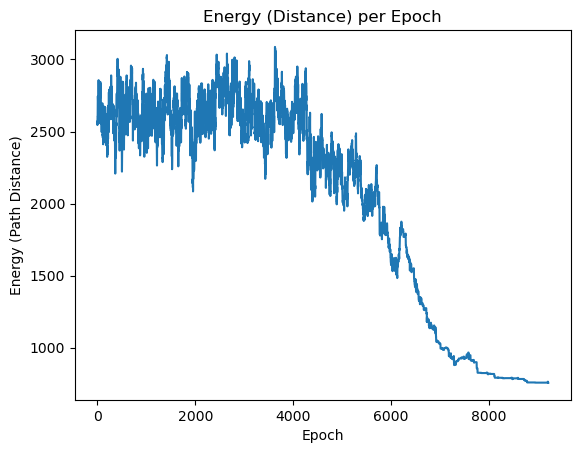

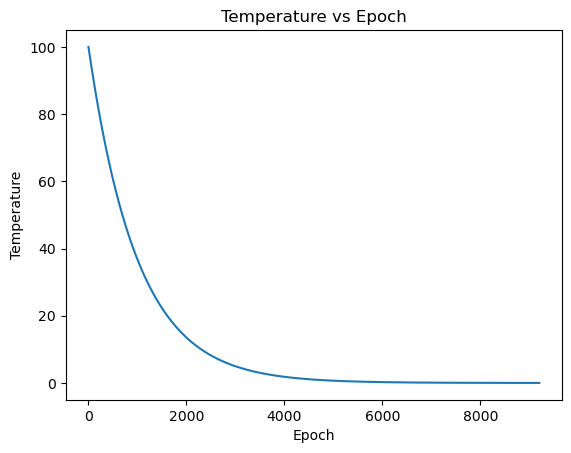

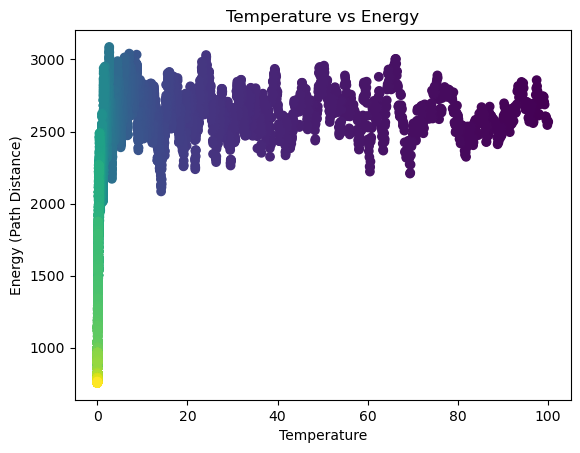

In [358]:
# create all the same graphs but with mathplotlib and save them to graphs folder

import matplotlib.pyplot as plt
import pandas as pd

# load the data
data = pd.read_csv('data.csv', names=['epoch', 'temperature', 'energy'])

# plot energy vs epoch
plt.figure()
plt.plot(data['epoch'], data['energy'])
plt.title('Energy (Distance) per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Energy (Path Distance)')
plt.savefig('graphs/energy.png')

# plot temperature vs epoch
plt.figure()
plt.plot(data['epoch'], data['temperature'])
plt.title('Temperature vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Temperature')
plt.savefig('graphs/temperature.png')

# create scatter plot of temperature vs energy
plt.figure()
plt.scatter(data['temperature'], data['energy'], c=data['epoch'])
plt.title('Temperature vs Energy')
plt.xlabel('Temperature')
plt.ylabel('Energy (Path Distance)')
plt.savefig('graphs/temp_vs_energy.png')

# create final path graph



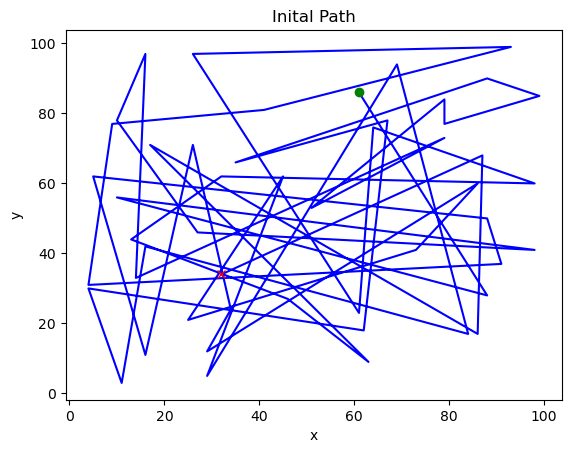

In [359]:
#inital path graph

# create  the inital path graph but with mathplotlib and save them to graphs folder

# load the data
path_data = pd.read_csv('path.csv', names=['x', 'y'])

# the first path is the inital path

# Create the path graph for the first path

# Split the data into separate paths assuming that each path has nCities points
num_paths = len(path_data) // nCities
paths = [path_data.iloc[i*nCities:(i+1)*nCities].reset_index(drop=True) for i in range(num_paths)]

# Create the inital path
inital_path = plt.plot(paths[0]['x'], paths[0]['y'], 'b-')

# mark the start and end points
plt.plot(paths[0]['x'][0], paths[0]['y'][0], 'go')
plt.plot(paths[0]['x'][len(paths[0])-1], paths[0]['y'][len(paths[0])-1], 'rx')

plt.title('Inital Path')
plt.xlabel('x')
plt.ylabel('y')
plt.savefig('graphs/inital_path.png')
plt.show()





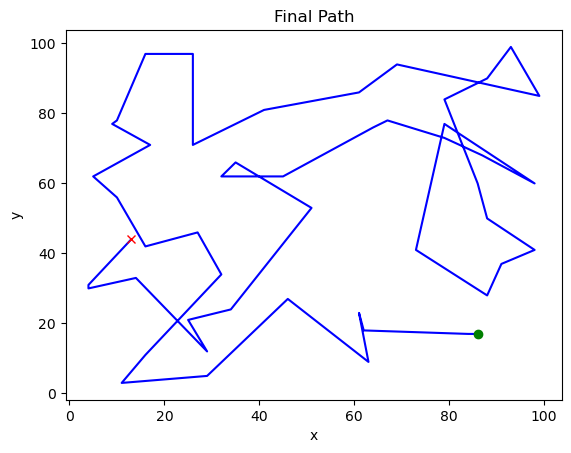

In [360]:
# create  the final path graph but with mathplotlib and save them to graphs folder

import matplotlib.pyplot as plt
import pandas as pd

# load the data
path_data = pd.read_csv('final.csv', names=['x', 'y'])

# Create the final path
final_path = plt.plot(path_data['x'], path_data['y'], 'b-')

# mark the start and end points
plt.plot(path_data['x'][0], path_data['y'][0], 'go')
plt.plot(path_data['x'][len(path_data)-1], path_data['y'][len(path_data)-1], 'rx')

plt.title('Final Path')
plt.xlabel('x')
plt.ylabel('y')
plt.savefig('graphs/final_path.png')
plt.show()
